# ***Multitask Multi attention Residual Shrinkage Convolutional Neural Network for Content-based Image Retrieval using cosine similarity and Attention feature fusion of AlexNet, VGG19 and ResNet50***

# Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Install necessary libraries

In [ ]:
!pip install pykalman

# Import libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import os
import random
import torch
from google.colab import files
import cv2


import warnings
warnings.filterwarnings('ignore')

# Read dataset

In [ ]:
ParentDir = '/content/drive/MyDrive/Mahalle/'
DataDir = '/content/drive/MyDrive/Mahalle/dataset/caltech 101'


# List all directories inside DataDir
dirs = [d for d in os.listdir(DataDir) if os.path.isdir(os.path.join(DataDir, d))]

# Print the directories and count the total number of files in each
print("caltech 101 Dataset:\n")
total_files = 0

for directory in dirs:
    dir_path = os.path.join(DataDir, directory)
    file_count = sum([len(files) for _, _, files in os.walk(dir_path)])
    total_files += file_count
    print(f"{directory}: {file_count} images")

# Print the total number of files across all directories
print(f"\nTotal number of images in DataDir: {total_files} images")


caltech 101 Dataset:

revolver: 82 images
Motorbikes: 798 images
watch: 239 images
scorpion: 84 images
starfish: 86 images
sunflower: 85 images
menorah: 87 images
laptop: 81 images
ketch: 114 images
kangaroo: 86 images
grand_piano: 99 images
buddha: 85 images
butterfly: 91 images
chandelier: 107 images
airplanes: 800 images

Total number of images in DataDir: 2924 images


# Preprocessing

In [ ]:
import os
import numpy as np
from torchvision import datasets, transforms
from pykalman import KalmanFilter

class Filter:
    def __init__(self, data_dir):
        self.data_dir = data_dir

    def kalman_filter(self, image):
        kf = KalmanFilter(initial_state_mean=0, n_dim_obs=1)

        # Flatten image to 1D for processing with Kalman filter
        flattened = image.flatten()
        measurements = np.reshape(flattened, (-1, 1))

        # Apply Kalman filter
        state_means, _ = kf.filter(measurements)
        denoised = state_means.reshape(image.shape)

        return denoised

    def preprocess_images(self,display_images = 5):
        # Define a more concise transformation pipeline
        transform = transforms.Compose([
            transforms.Resize((224, 224)),                   # Resize images
            transforms.RandomHorizontalFlip(),               # Randomly flip images horizontally
            transforms.RandomRotation(15),                   # Randomly rotate images by up to 15 degrees
            transforms.ColorJitter(brightness=0.2,           # Randomly adjust brightness, contrast, saturation, and hue
                                   contrast=0.2,
                                   saturation=0.2, hue=0.1),
            transforms.ToTensor(),                           # Convert the image to a tensor
            transforms.Normalize(mean=[0.485, 0.456, 0.406],# Normalize the tensor
                                 std=[0.229, 0.224, 0.225])
        ])

        # Load and preprocess the dataset
        dataset = datasets.ImageFolder(root=self.data_dir, transform=transform)

        return dataset


filter_instance = Filter(DataDir)
preprocessed_images = filter_instance.preprocess_images(display_images = 5  )

# Before and After preprocessing images

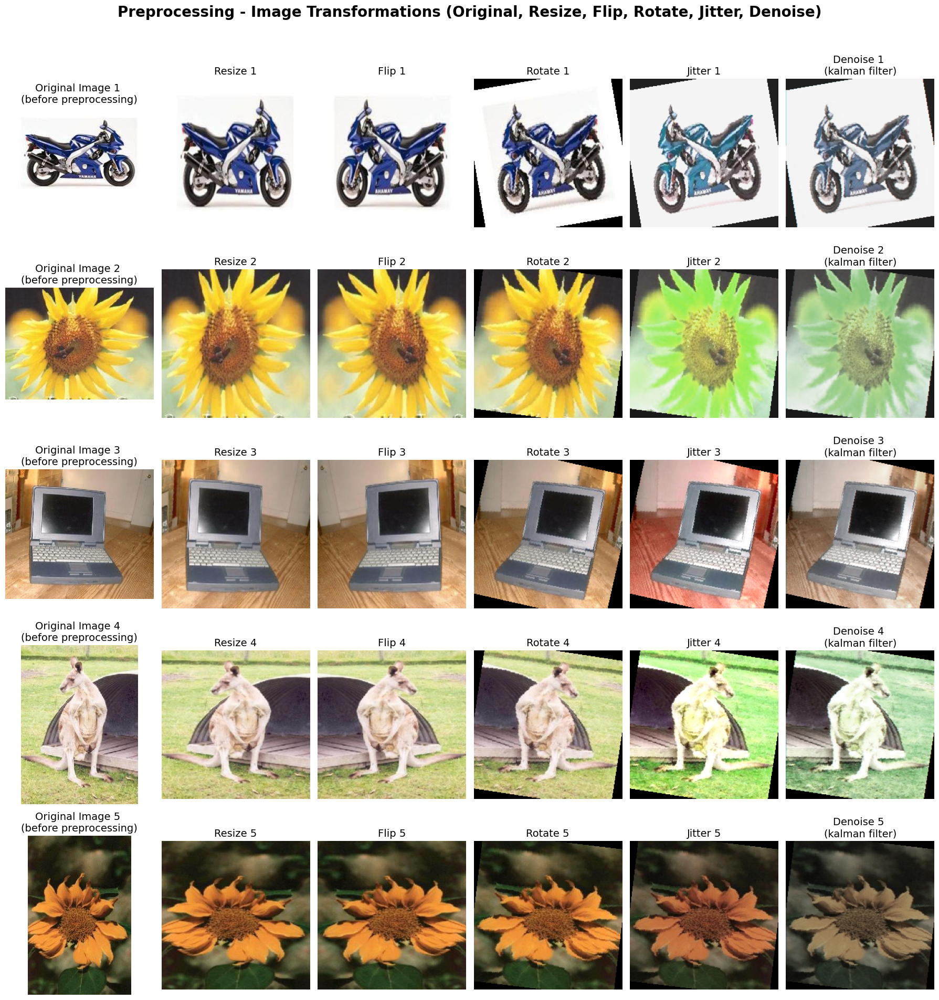

In [ ]:
import os
import numpy as np
import torch
from torchvision import datasets, transforms
from pykalman import KalmanFilter
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import Subset

# Define the transformations
transform_resize = transforms.Resize((224, 224))
transform_flip = transforms.RandomHorizontalFlip(p=1)  # Always flip for visualization
transform_rotate = transforms.RandomRotation(15)
transform_jitter = transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1)
transform_to_tensor = transforms.ToTensor()

# Define the Kalman filter function for denoising
def apply_kalman_filter(image):
    kf = KalmanFilter(initial_state_mean=0, n_dim_obs=1)

    # Flatten image to 1D for processing with Kalman filter
    flattened = np.array(image).flatten()
    measurements = np.reshape(flattened, (-1, 1))

    # Apply Kalman filter
    state_means, _ = kf.filter(measurements)
    denoised = state_means.reshape(image.size[1], image.size[0], 3)  # Reshape back to original size
    return Image.fromarray(np.uint8(denoised))

# Create a figure with subplots (5 rows, 6 columns for each step including denoising)
display_images = 5
fig, axes = plt.subplots(display_images, 6, figsize=(18, display_images * 4))
fig.suptitle("Preprocessing - Image Transformations (Original, Resize, Flip, Rotate, Jitter, Denoise)", fontsize=20, fontweight='bold')


dataset_ = datasets.ImageFolder(root=DataDir)

indices = list(range(len(dataset_)))
np.random.shuffle(indices)

# Use Subset to shuffle the dataset
shuffled_dataset = Subset(dataset_, indices)

# Loop through the first 'display_images' images and apply transformations
for i in range(display_images):
    image, _ = shuffled_dataset[i]  # Load image

    # Ensure that the image is a PIL image for further transformations
    if isinstance(image, torch.Tensor):
        image = transforms.ToPILImage()(image)

    # Step 1: Original Image
    axes[i, 0].imshow(image)
    axes[i, 0].set_title(f"Original Image {i+1} \n(before preprocessing)", fontsize=14)
    axes[i, 0].axis('off')

    # Step 2: Resize
    resized_image = transform_resize(image)
    axes[i, 1].imshow(resized_image)
    axes[i, 1].set_title(f"Resize {i+1}", fontsize=14)
    axes[i, 1].axis('off')

    # Step 3: Horizontal Flip
    flipped_image = transform_flip(resized_image)
    axes[i, 2].imshow(flipped_image)
    axes[i, 2].set_title(f"Flip {i+1}", fontsize=14)
    axes[i, 2].axis('off')

    # Step 4: Rotate
    rotated_image = transform_rotate(flipped_image)
    axes[i, 3].imshow(rotated_image)
    axes[i, 3].set_title(f"Rotate {i+1}", fontsize=14)
    axes[i, 3].axis('off')

    # Step 5: Color Jitter
    jittered_image = transform_jitter(rotated_image)
    axes[i, 4].imshow(jittered_image)
    axes[i, 4].set_title(f"Jitter {i+1}", fontsize=14)
    axes[i, 4].axis('off')

    # Step 6: Denoise with Kalman Filter
    denoised_image = apply_kalman_filter(jittered_image)
    axes[i, 5].imshow(denoised_image)
    axes[i, 5].set_title(f"Denoise {i+1} \n(kalman filter)", fontsize=14)
    axes[i, 5].axis('off')

# Adjust layout and show the plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# Visualize images

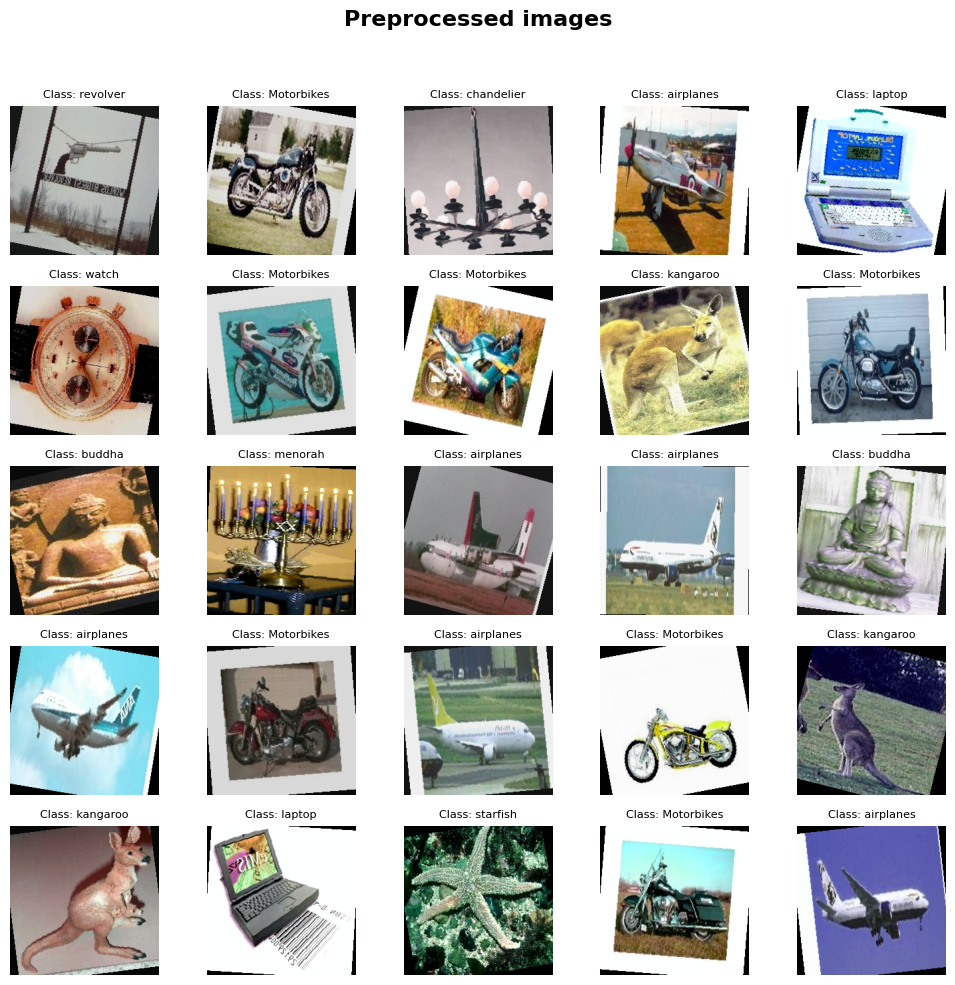

In [ ]:
def imshow(img, title=None):
    """
    Unnormalize and display an image.
    Args:
    - img (Tensor): The image tensor to display.
    - title (str): Optional title to display above the image.
    """
    img = img.numpy().transpose((1, 2, 0))  # Convert from (C, H, W) to (H, W, C)
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean  # Unnormalize
    img = np.clip(img, 0, 1)  # Clip values to be in the range [0, 1]

    plt.imshow(img)
    if title is not None:
        plt.title(title, fontsize=8)
    plt.axis('off')

def visualize_random_images(dataset, num_images=25):
    """
    Display a grid of randomly selected images from the dataset.
    Args:
    - dataset (Dataset): The dataset from which to draw images.
    - num_images (int): The number of images to display.
    """
    # Randomly select a subset of images
    indices = random.sample(range(len(dataset)), num_images)
    images = [dataset[i][0] for i in indices]
    labels = [dataset[i][1] for i in indices]

    # Determine grid size
    grid_size = int(np.sqrt(num_images))

    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        plt.subplot(grid_size, grid_size, i + 1)
        imshow(images[i], title=f'Class: {dataset.classes[labels[i]]}')

    plt.suptitle('Preprocessed images', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Visualize 25 random images from the dataset
visualize_random_images(preprocessed_images, num_images=25)


# Device configurations

In [ ]:
# Check if GPU is available and use it, otherwise fallback to CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Spliting the dataset

In [ ]:
import torch
from torch.utils.data import DataLoader, random_split, Dataset

# Define your dataset
# Assuming 'preprocessed_images' is your full dataset of type Dataset
full_dataset = preprocessed_images

# Assuming preprocessed_images is a Dataset object
data_loader = DataLoader(preprocessed_images, batch_size=32, shuffle=False)

# Define the split ratios
train_ratio = 0.7
val_ratio = 0.1
test_ratio = 0.2

train_size = int(train_ratio * len(full_dataset))
val_size = int(val_ratio * len(full_dataset))
test_size = len(full_dataset) - train_size - val_size

# Split the dataset into train, validation, and test sets
train_dataset, val_dataset, test_dataset = random_split(full_dataset, [train_size, val_size, test_size])

# Define DataLoaders for train, validation, and test sets
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Function to get image size from the dataset
def get_image_size(dataset):
    # Assuming the dataset returns a tensor with shape (C, H, W)
    sample_image, _ = dataset[0]
    if isinstance(sample_image, torch.Tensor):
        return sample_image.shape[1:]  # returns (height, width)
    else:
        return None

# Get image size from one of the datasets
image_size = get_image_size(full_dataset)

# Print information about each DataLoader
print(f"Training DataLoader:")
print(f"Number of batches: {len(train_loader)}")
print(f"Batch size: {train_loader.batch_size}")
print(f"Total number of images: {len(train_loader.dataset)}")
print(f"Image size: {image_size}")

print(f"\nValidation DataLoader:")
print(f"Number of batches: {len(val_loader)}")
print(f"Batch size: {val_loader.batch_size}")
print(f"Total number of images: {len(val_loader.dataset)}")
print(f"Image size: {image_size}")

print(f"\nTest DataLoader:")
print(f"Number of batches: {len(test_loader)}")
print(f"Batch size: {test_loader.batch_size}")
print(f"Total number of images: {len(test_loader.dataset)}")
print(f"Image size: {image_size}")


Training DataLoader:
Number of batches: 64
Batch size: 32
Total number of images: 2046
Image size: torch.Size([224, 224])

Validation DataLoader:
Number of batches: 10
Batch size: 32
Total number of images: 292
Image size: torch.Size([224, 224])

Test DataLoader:
Number of batches: 19
Batch size: 32
Total number of images: 586
Image size: torch.Size([224, 224])


# Build model

# Multitask Multi-Attention Residual Shrinkage Convolutional Neural Network with AlexNet

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from tqdm import tqdm
from torchsummary import summary


# Define the Multitask Multi-Attention Residual Shrinkage Convolutional Neural Network with AlexNet
class MARSCNN_AlexNet(nn.Module):
    def __init__(self, num_classes=15):
        super(MARSCNN_AlexNet, self).__init__()

        # Load the pre-trained AlexNet model
        alexnet = models.alexnet(pretrained=True)

        # Remove the classifier to get the feature extractor part
        self.feature_extractor = nn.Sequential(*list(alexnet.children())[:-1])

        # Define the additional layers for MARSCNN
        self.conv1 = nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1)
        self.attention = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=1),
            nn.Sigmoid()
        )
        self.residual_shrinkage = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1)
        )
        # Final fully connected layer matching the number of classes
        self.fc = nn.Linear(128 * 6 * 6, num_classes)

    def forward(self, x):
        # Forward pass through AlexNet feature extractor
        x = self.feature_extractor(x)

        # Reshape output from the feature extractor to match the input size of conv layers
        x = x.view(x.size(0), -1, 6, 6)  # Adjust based on AlexNet output size

        # Forward through MARSCNN layers
        x = self.conv1(x)
        attention_weights = self.attention(x)
        x = x * attention_weights
        x = self.residual_shrinkage(x) + x  # Residual connection

        # Flatten and pass through the fully connected layer
        x = torch.flatten(x, 1)
        x = self.fc(x)

        return x

# Instantiate the model
num_classes = 15
model_1 = MARSCNN_AlexNet(num_classes=num_classes).to(device)

print("Model: MARSCNN_AlexNet")
summary(model_1, (3, 224, 224))

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:08<00:00, 30.2MB/s]


Model: MARSCNN_AlexNet
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2

In [ ]:
# Import the necessary module for mixed precision
from torch.cuda.amp import GradScaler, autocast
from torch import nn
import torch
from tqdm import tqdm

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_1.parameters(), lr=0.001)

# Lists to store loss and accuracy history
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

model_1.train()

# Initialize a GradScaler
scaler = GradScaler()

# Example Training Loop with Mixed Precision
for epoch in range(5):  # Example for 5 epochs
    model_1.train()
    running_loss = 0.0
    correct = 0
    total = 0

    # Training loop
    for images, labels in tqdm(train_loader):
        images, labels = images.to(device), labels.to(device)

        # Forward pass with mixed precision
        optimizer.zero_grad()
        with autocast():
            outputs = model_1(images)
            loss = criterion(outputs, labels)

        # Backward pass with gradient scaling
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    avg_loss = running_loss / len(train_loader)
    accuracy = 100 * correct / total

    train_losses.append(avg_loss)
    train_accuracies.append(accuracy)

    print(f"Epoch [{epoch + 1}/5], Training Loss: {avg_loss:.4f}, Training Accuracy: {accuracy:.2f}%")

    # Validation loop
    model_1.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for val_images, val_labels in tqdm(val_loader):
            val_images, val_labels = val_images.to(device), val_labels.to(device)

            # Forward pass with mixed precision
            with autocast():
                val_outputs = model_1(val_images)
                val_loss = criterion(val_outputs, val_labels)

            val_running_loss += val_loss.item()
            _, val_predicted = torch.max(val_outputs.data, 1)
            val_total += val_labels.size(0)
            val_correct += (val_predicted == val_labels).sum().item()

    val_avg_loss = val_running_loss / len(val_loader)
    val_accuracy = 100 * val_correct / val_total

    val_losses.append(val_avg_loss)
    val_accuracies.append(val_accuracy)

    print(f"Epoch [{epoch + 1}/5], Validation Loss: {val_avg_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")



100%|██████████| 64/64 [08:25<00:00,  7.90s/it]


Epoch [1/5], Training Loss: 1.3751, Training Accuracy: 61.58%


100%|██████████| 10/10 [01:07<00:00,  6.70s/it]


Epoch [1/5], Validation Loss: 0.6180, Validation Accuracy: 78.77%


100%|██████████| 64/64 [00:24<00:00,  2.61it/s]


Epoch [2/5], Training Loss: 0.7397, Training Accuracy: 77.96%


100%|██████████| 10/10 [00:03<00:00,  3.22it/s]


Epoch [2/5], Validation Loss: 0.6394, Validation Accuracy: 80.82%


100%|██████████| 64/64 [00:24<00:00,  2.64it/s]


Epoch [3/5], Training Loss: 0.4798, Training Accuracy: 85.34%


100%|██████████| 10/10 [00:03<00:00,  3.25it/s]


Epoch [3/5], Validation Loss: 0.2933, Validation Accuracy: 89.38%


100%|██████████| 64/64 [00:24<00:00,  2.61it/s]


Epoch [4/5], Training Loss: 0.3538, Training Accuracy: 89.25%


100%|██████████| 10/10 [00:03<00:00,  3.22it/s]


Epoch [4/5], Validation Loss: 0.3020, Validation Accuracy: 89.38%


100%|██████████| 64/64 [00:24<00:00,  2.64it/s]


Epoch [5/5], Training Loss: 0.2882, Training Accuracy: 91.45%


100%|██████████| 10/10 [00:03<00:00,  3.15it/s]

Epoch [5/5], Validation Loss: 0.2929, Validation Accuracy: 89.73%


In [ ]:
# Create a DataFrame
marscnn_alexnet_model_his = pd.DataFrame({
    'Train Loss': train_losses,
    'Train Accuracy': train_accuracies,
    'Validation Loss': val_losses,
    'Validation Accuracy': val_accuracies
})

# Optionally, save the DataFrame to a CSV file
marscnn_alexnet_model_his.to_csv(ParentDir + 'marscnn_alexnet_history.csv', index=False)

# Print the DataFrame to verify
marscnn_alexnet_model_his

,Train Loss,Train Accuracy,Validation Loss,Validation Accuracy
0,1.375097,61.583578,0.617951,78.767123
1,0.739671,77.956989,0.639351,80.821918
2,0.479835,85.337243,0.293313,89.383562
3,0.353766,89.247312,0.301970,89.383562
4,0.288188,91.446725,0.292940,89.726027


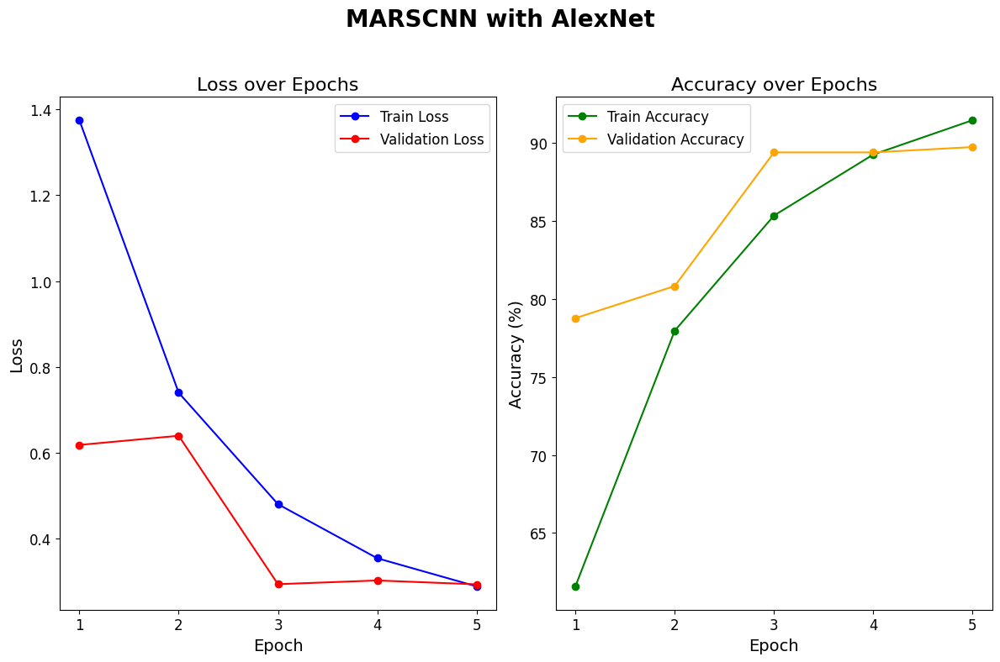

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

marscnn_alexnet_model_his = pd.read_csv(ParentDir + 'marscnn_alexnet_history.csv')
# Plotting the loss and accuracy history from the DataFrame
plt.figure(figsize=(12, 8))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(marscnn_alexnet_model_his.index + 1, marscnn_alexnet_model_his['Train Loss'], marker='o', linestyle='-', color='b', label='Train Loss')
plt.plot(marscnn_alexnet_model_his.index + 1, marscnn_alexnet_model_his['Validation Loss'], marker='o', linestyle='-', color='r', label='Validation Loss')
plt.title('Loss over Epochs', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.xticks(np.arange(1, len(marscnn_alexnet_model_his) + 1), fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(marscnn_alexnet_model_his.index + 1, marscnn_alexnet_model_his['Train Accuracy'], marker='o', linestyle='-', color='g', label='Train Accuracy')
plt.plot(marscnn_alexnet_model_his.index + 1, marscnn_alexnet_model_his['Validation Accuracy'], marker='o', linestyle='-', color='orange', label='Validation Accuracy')
plt.title('Accuracy over Epochs', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Accuracy (%)', fontsize=14)
plt.xticks(np.arange(1, len(marscnn_alexnet_model_his) + 1), fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

plt.suptitle('MARSCNN with AlexNet', fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])

plt.show()


# Save model

In [ ]:
# Save the model's state dictionary
torch.save(model_1.state_dict(), ParentDir + 'marscnn_alexnet_state_dict.pth')

# Load model

In [ ]:
alex_net_model_path = ParentDir + 'marscnn_alexnet_state_dict.pth'
alexnet_model = MARSCNN_AlexNet(num_classes=15).to(device)
alexnet_model.load_state_dict(torch.load(alex_net_model_path,map_location=torch.device('cpu') ))
alexnet_model.eval()

MARSCNN_AlexNet(
  (feature_extractor): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
      (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (4): ReLU(inplace=True)
      (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
      (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (7): ReLU(inplace=True)
      (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): ReLU(inplace=True)
      (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (1): AdaptiveAvgPool2d(output_size=(6, 6))
  )
  (conv1): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), pad

# Results

# Model evaluation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

alexnet_model.eval()  # Set the model to evaluation mode
all_labels = []
all_preds = []

with torch.no_grad():  # Disable gradient calculation for inference
    for images, labels in tqdm(test_loader):
        images, labels = images.to(device), labels.to(device)
        outputs = alexnet_model(images)
        _, predicted = torch.max(outputs.data, 1)

        # Collect all labels and predictions
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(predicted.cpu().numpy())

# Convert lists to numpy arrays
all_labels = np.array(all_labels)
all_preds = np.array(all_preds)


100%|██████████| 19/19 [02:32<00:00,  8.03s/it]


<Figure size 1200x1000 with 0 Axes>

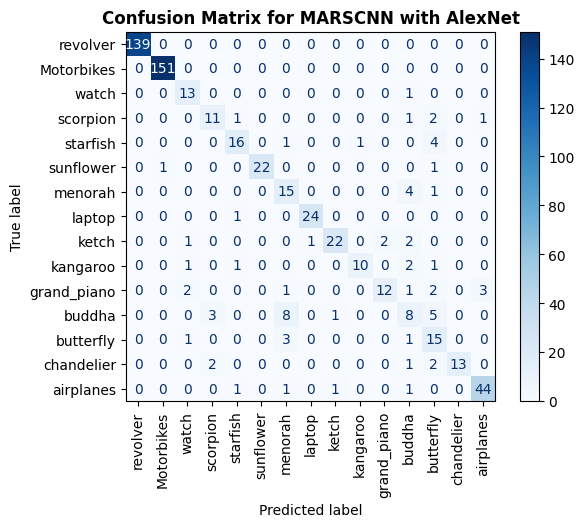

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)
classes = os.listdir(DataDir)

plt.figure(figsize=(12, 10))
# Plotting the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for MARSCNN with AlexNet',fontweight = 'bold')
plt.xticks(np.arange(0,15),classes,rotation=90)
plt.yticks(np.arange(0,15),classes,rotation=0)
plt.show()

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Compute macro-averaged metrics
accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='micro')
recall = recall_score(all_labels, all_preds, average='micro')
f1 = f1_score(all_labels, all_preds, average='micro')

# Print the macro-averaged metrics
print(f"Accuracy: {accuracy:.6f}")
print(f"Precision: {precision:.6f}")
print(f"Recall: {recall:.6f}")
print(f"F1 Score: {f1:.6f}")
print(f"Error rate: {1-accuracy:.6f}")


Accuracy: 0.878840
Precision: 0.878840
Recall: 0.878840
F1 Score: 0.878840
Error rate: 0.121160


In [ ]:
# Create a DataFrame with metric names as columns
results_1 = {
    'Accuracy': [accuracy],
    'Precision': [precision],
    'Recall': [recall],
    'F1 Score': [f1],
    'Error Rate': [1-accuracy],
    'Model': ["MARSCNN_AlexNet"]
}

df = pd.DataFrame(results_1)

# # Save DataFrame to a CSV file
df.to_csv(ParentDir + 'model_comparison_results.csv', index=False)

# Dataset feature vector extraction using AlexNet

In [ ]:
# Load the pre-trained AlexNet model
alexnet = models.alexnet(pretrained=True)

# Remove the classification layer
alexnet.classifier = torch.nn.Sequential(*list(alexnet.classifier.children())[:-1])

# Set the model to evaluation mode and move it to the GPU
alexnet = alexnet.to(device)

alexnet.eval()

def extract_features(data_loader, model):
    features_list = []

    with torch.no_grad():
        # Wrap the DataLoader with tqdm to show progress
        for images, _ in tqdm(data_loader, desc="Extracting Features"):
            # Move images to the same device as the model
            images = images.to(device)

            # Extract features
            features = model(images)
            features_list.append(features.cpu())  # Move features to CPU for concatenation

    # Concatenate all features into a single tensor
    all_features = torch.cat(features_list, dim=0)
    return all_features


alexnet_db_features = extract_features(data_loader,alexnet)

saving_path = ParentDir + 'alexnet_db_features.pth'
# Save the features to a file
torch.save(alexnet_db_features,saving_path)
print(f"\ndataset Feature vector saved to {saving_path}")

Extracting Features: 100%|██████████| 92/92 [00:33<00:00,  2.74it/s]



dataset Feature vector saved to /content/drive/MyDrive/Mahalle/alexnet_db_features.pth


# Content based Image Retrivel system

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import torch.nn as nn

class ImageRetrieval:
    def __init__(self, model, device, db_features, transform=None):
        self.model = model.to(device)
        self.device = device
        self.db_features = db_features
        self.transform = transform or transforms.Compose([
            transforms.Resize((224, 224)),                    # Resize image to 224x224 pixels
            transforms.RandomHorizontalFlip(),                # Randomly flip images horizontally
            transforms.RandomRotation(degrees=15),            # Randomly rotate images by up to 15 degrees
            transforms.ColorJitter(brightness=0.2,            # Randomly adjust brightness, contrast, saturation, and hue
                                   contrast=0.2,
                                   saturation=0.2, hue=0.1),
            transforms.ToTensor(),                            # Convert the image to a tensor
            transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize the tensor
                                 std=[0.229, 0.224, 0.225])
        ])

    def preprocess_query_image(self, image_path):
        # Load and preprocess the image using the defined transformations
        image = Image.open(image_path).convert('RGB')
        image = self.transform(image).unsqueeze(0)  # Add batch dimension
        return image.to(self.device)

    def extract_query_feature(self, image_tensor):
        with torch.no_grad():
            features = self.model(image_tensor)

            # Flatten the features if the model is a sequential model (like ResNet)
            if isinstance(self.model, nn.Module) and (isinstance(self.model, nn.Sequential) or features.dim() == 4):
                pool = nn.AdaptiveAvgPool2d((1, 1))
                features = pool(features).view(features.size(0), -1)

        return features

    def compute_similarity(self, query_features):
        # Compute cosine similarity
        similarity = cosine_similarity(query_features.cpu(), self.db_features.cpu())
        return similarity.flatten()

    def retrieve_top_n_similar_images(self, query_image_path, dataset_loader, top_n=25):
        # Preprocess the query image
        query_tensor = self.preprocess_query_image(query_image_path)

        # Extract features for the query image
        query_features = self.extract_query_feature(query_tensor)

        # Compute similarity scores
        similarity = self.compute_similarity(query_features)

        # Get top N similar images
        top_indices = np.argsort(-similarity)[:top_n]
        top_images = [dataset_loader.dataset.imgs[idx][0] for idx in top_indices]

        return top_images, similarity[top_indices]

    @staticmethod
    def show_images_in_tile(image_paths, tile_size=(5, 5), titles=None, subtitle=None):
        top_n = len(image_paths)
        plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
        for i, image_path in enumerate(image_paths):
            img = Image.open(image_path)
            plt.subplot(tile_size[0], tile_size[1], i + 1)
            plt.imshow(img)
            plt.axis('off')
            if titles.all():
                plt.title(f"Rank {i+1}\nscore : {titles[i]:.6f}",fontsize=14)

        plt.suptitle(f'Top {top_n} Retrieved images using {subtitle}', fontsize=20, fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    @staticmethod
    def show_query_image(query_image_path):
        plt.figure(figsize=(6, 6))  # Adjust the figure size as needed
        img = Image.open(query_image_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title("Query Image")
        plt.show()


# Query 1

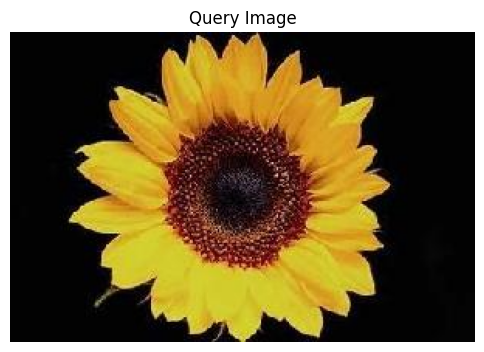

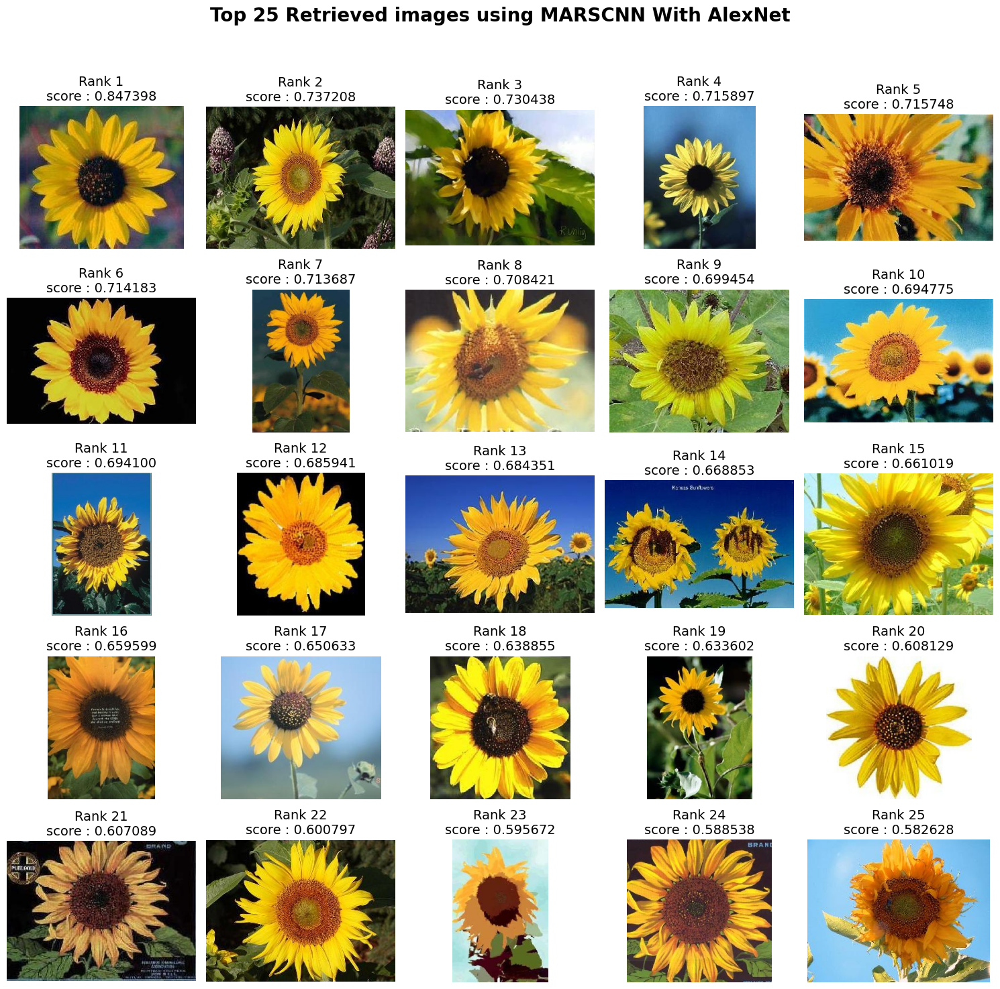

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models

# Load the pre-trained AlexNet model
alex_net_model_path = ParentDir + 'marscnn_alexnet_state_dict.pth'
alexnet_model = MARSCNN_AlexNet(num_classes=15).to(device)
alexnet_model.load_state_dict(torch.load(alex_net_model_path,map_location=torch.device('cpu') ))


alexnet = models.alexnet(pretrained=True)

# Remove the classification layer
alexnet.classifier = torch.nn.Sequential(*list(alexnet.classifier.children())[:-1])

# Set the model to evaluation mode and move it to the GPU
alexnet = alexnet.to(device)

alexnet.eval()

db_features = torch.load(ParentDir + 'alexnet_db_features.pth')

# Assuming preprocessed_images is a Dataset object
data_loader = DataLoader(preprocessed_images, batch_size=32, shuffle=False)

image_retrieval = ImageRetrieval(model=alexnet, device=device, db_features=db_features )

query_image_path = '/content/drive/MyDrive/Mahalle/dataset/caltech 101/sunflower/image_0001.jpg'

top_images, top_ranks = image_retrieval.retrieve_top_n_similar_images(query_image_path, data_loader, top_n=25)

# Display the query image
image_retrieval.show_query_image(query_image_path)

print()
# Show images in a tile
image_retrieval.show_images_in_tile(top_images, tile_size=(5, 5), titles=top_ranks, subtitle='MARSCNN With AlexNet')

# Multitask Multi-Attention Residual Shrinkage Convolutional Neural Network with VGG19

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from tqdm import tqdm
from torchsummary import summary

# Define the Multitask Multi-Attention Residual Shrinkage Convolutional Neural Network with VGG19
class MARSCNN_VGG19(nn.Module):
    def __init__(self, num_classes=15):
        super(MARSCNN_VGG19, self).__init__()

        # Load the pre-trained VGG19 model
        vgg19 = models.vgg19(pretrained=True)

        # Remove the classifier to get the feature extractor part
        self.feature_extractor = nn.Sequential(*list(vgg19.features.children()))

        # Unfreeze the last few layers of VGG19 for fine-tuning
        for param in self.feature_extractor.parameters():
            param.requires_grad = False
        for param in self.feature_extractor[-3:].parameters():
            param.requires_grad = True

        # Define the additional layers for MARSCNN
        self.conv1 = nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(256)  # Add batch normalization
        self.attention = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=1),
            nn.Sigmoid()
        )
        self.residual_shrinkage = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        )
        self.dropout = nn.Dropout(0.5)  # Add dropout layer

        # Final fully connected layer matching the number of classes
        self.fc = nn.Linear(256 * 7 * 7, num_classes)

    def forward(self, x):
        # Forward pass through VGG19 feature extractor
        x = self.feature_extractor(x)

        # Reshape output from the feature extractor to match the input size of conv layers
        x = x.view(x.size(0), -1, 7, 7)

        # Forward through MARSCNN layers
        x = self.conv1(x)
        x = self.bn1(x)  # Apply batch normalization
        attention_weights = self.attention(x)
        x = x * attention_weights
        x = self.residual_shrinkage(x) + x  # Residual connection

        # Flatten and pass through the fully connected layer
        x = torch.flatten(x, 1)
        x = self.dropout(x)  # Apply dropout
        x = self.fc(x)

        return x
# Instantiate the model
num_classes = 15
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_2 = MARSCNN_VGG19(num_classes=num_classes).to(device)

print("Model: MARSCNN_VGG19")
summary(model_2, (3, 224, 224))


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:08<00:00, 71.2MB/s]


Model: MARSCNN_VGG19
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-

In [ ]:
# Import the necessary module for mixed precision
from torch.cuda.amp import GradScaler, autocast
from torch import nn
import torch
from tqdm import tqdm

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_2.parameters(), lr=0.001)  # Use model_2 parameters for VGG19-based model

# Lists to store loss and accuracy history
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

# Ensure the model is in training mode
model_2.train()

# Initialize a GradScaler for mixed precision
scaler = GradScaler()

# Example Training Loop with Mixed Precision for 5 epochs
for epoch in range(5):
    model_2.train()
    running_loss = 0.0
    correct = 0
    total = 0

    # Training loop
    for images, labels in tqdm(train_loader):
        images, labels = images.to(device), labels.to(device)

        # Forward pass with mixed precision
        optimizer.zero_grad()
        with autocast():
            outputs = model_2(images)  # Use model_2 for forward pass
            loss = criterion(outputs, labels)

        # Backward pass with gradient scaling
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    avg_loss = running_loss / len(train_loader)
    accuracy = 100 * correct / total

    train_losses.append(avg_loss)
    train_accuracies.append(accuracy)

    print(f"Epoch [{epoch + 1}/5], Training Loss: {avg_loss:.4f}, Training Accuracy: {accuracy:.2f}%")

    # Validation loop
    model_2.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for val_images, val_labels in tqdm(val_loader):
            val_images, val_labels = val_images.to(device), val_labels.to(device)

            # Forward pass with mixed precision
            with autocast():
                val_outputs = model_2(val_images)  # Use model_2 for validation forward pass
                val_loss = criterion(val_outputs, val_labels)

            val_running_loss += val_loss.item()
            _, val_predicted = torch.max(val_outputs.data, 1)
            val_total += val_labels.size(0)
            val_correct += (val_predicted == val_labels).sum().item()

    val_avg_loss = val_running_loss / len(val_loader)
    val_accuracy = 100 * val_correct / val_total

    val_losses.append(val_avg_loss)
    val_accuracies.append(val_accuracy)

    print(f"Epoch [{epoch + 1}/5], Validation Loss: {val_avg_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")


100%|██████████| 64/64 [00:28<00:00,  2.23it/s]


Epoch [1/5], Training Loss: 0.4978, Training Accuracy: 90.13%


100%|██████████| 10/10 [00:04<00:00,  2.24it/s]


Epoch [1/5], Validation Loss: 0.2579, Validation Accuracy: 93.49%


100%|██████████| 64/64 [00:27<00:00,  2.30it/s]


Epoch [2/5], Training Loss: 0.2953, Training Accuracy: 94.09%


100%|██████████| 10/10 [00:03<00:00,  2.68it/s]


Epoch [2/5], Validation Loss: 0.1295, Validation Accuracy: 96.58%


100%|██████████| 64/64 [00:28<00:00,  2.27it/s]


Epoch [3/5], Training Loss: 0.2005, Training Accuracy: 97.56%


100%|██████████| 10/10 [00:03<00:00,  2.70it/s]


Epoch [3/5], Validation Loss: 0.0724, Validation Accuracy: 97.60%


100%|██████████| 64/64 [00:28<00:00,  2.25it/s]


Epoch [4/5], Training Loss: 0.1521, Training Accuracy: 96.38%


100%|██████████| 10/10 [00:04<00:00,  2.33it/s]


Epoch [4/5], Validation Loss: 0.0770, Validation Accuracy: 97.60%


100%|██████████| 64/64 [00:29<00:00,  2.18it/s]


Epoch [5/5], Training Loss: 0.0434, Training Accuracy: 98.92%


100%|██████████| 10/10 [00:03<00:00,  2.65it/s]

Epoch [5/5], Validation Loss: 0.0700, Validation Accuracy: 97.95%


In [ ]:
# Create a DataFrame
marscnn_vgg19_model_his = pd.DataFrame({
    'Train Loss': train_losses,
    'Train Accuracy': train_accuracies,
    'Validation Loss': val_losses,
    'Validation Accuracy': val_accuracies
})

# Optionally, save the DataFrame to a CSV file
marscnn_vgg19_model_his.to_csv(ParentDir + 'marscnn_vgg19_history.csv', index=False)

# Print the DataFrame to verify
marscnn_vgg19_model_his

,Train Loss,Train Accuracy,Validation Loss,Validation Accuracy
0,0.497799,90.127077,0.257892,93.493151
1,0.295345,94.086022,0.129545,96.575342
2,0.200479,97.556207,0.072429,97.602740
3,0.152106,96.383187,0.076958,97.602740
4,0.043393,98.924731,0.070013,97.945205


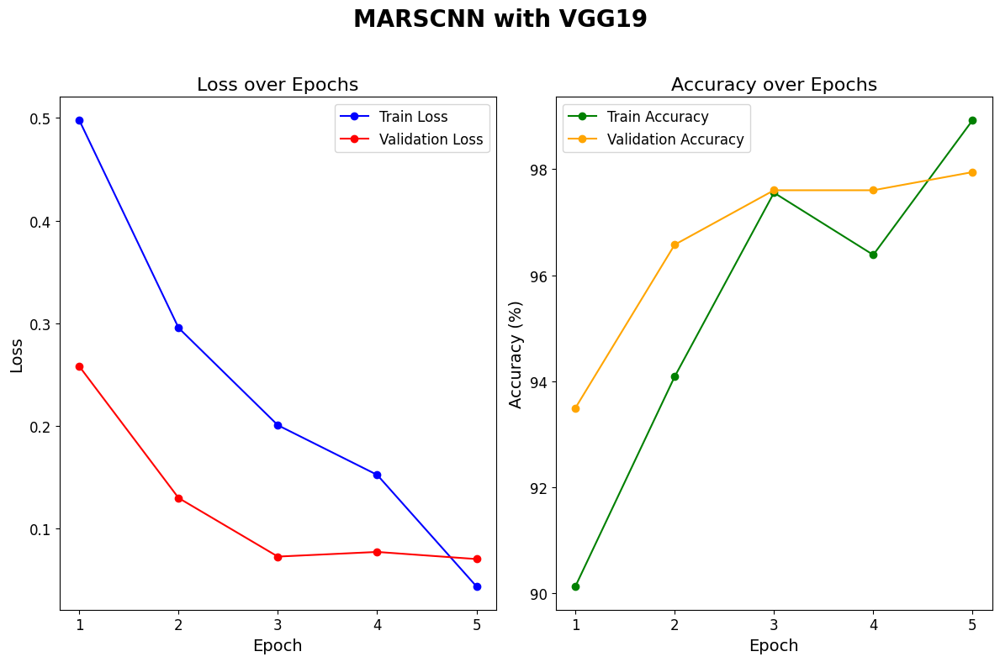

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

marscnn_vgg19_model_his = pd.read_csv(ParentDir + 'marscnn_vgg19_history.csv')

# Plotting the loss and accuracy history from the DataFrame
plt.figure(figsize=(12, 8))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(marscnn_vgg19_model_his.index + 1, marscnn_vgg19_model_his['Train Loss'], marker='o', linestyle='-', color='b', label='Train Loss')
plt.plot(marscnn_vgg19_model_his.index + 1, marscnn_vgg19_model_his['Validation Loss'], marker='o', linestyle='-', color='r', label='Validation Loss')
plt.title('Loss over Epochs', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.xticks(np.arange(1, len(marscnn_vgg19_model_his) + 1), fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(marscnn_vgg19_model_his.index + 1, marscnn_vgg19_model_his['Train Accuracy'], marker='o', linestyle='-', color='g', label='Train Accuracy')
plt.plot(marscnn_vgg19_model_his.index + 1, marscnn_vgg19_model_his['Validation Accuracy'], marker='o', linestyle='-', color='orange', label='Validation Accuracy')
plt.title('Accuracy over Epochs', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Accuracy (%)', fontsize=14)
plt.xticks(np.arange(1, len(marscnn_vgg19_model_his) + 1), fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

plt.suptitle('MARSCNN with VGG19', fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])

plt.show()


# Save model

In [ ]:
# Save the model's state dictionary
torch.save(model_2.state_dict(), ParentDir + 'marscnn_vgg19_state_dict.pth')

# Load model

In [ ]:
vgg19_model_path = ParentDir + 'marscnn_vgg19_state_dict.pth'
vgg19_model = MARSCNN_VGG19(num_classes=15).to(device)
vgg19_model.load_state_dict(torch.load(vgg19_model_path,map_location=torch.device('cpu') ))
vgg19_model.eval()

MARSCNN_VGG19(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), 

# Results

# Model evaluation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

vgg19_model.eval()  # Set the model to evaluation mode
all_labels = []
all_preds = []

with torch.no_grad():  # Disable gradient calculation for inference
    for images, labels in tqdm(test_loader):
        images, labels = images.to(device), labels.to(device)
        outputs = vgg19_model(images)
        _, predicted = torch.max(outputs.data, 1)

        # Collect all labels and predictions
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(predicted.cpu().numpy())

# Convert lists to numpy arrays
all_labels = np.array(all_labels)
all_preds = np.array(all_preds)


100%|██████████| 19/19 [00:10<00:00,  1.83it/s]


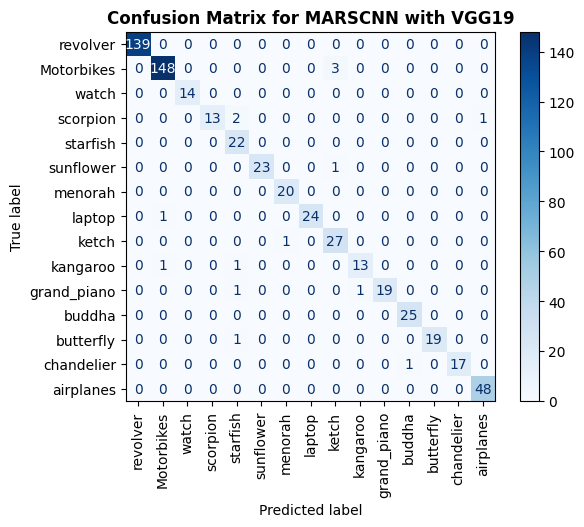

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)
classes = os.listdir(DataDir)

# Plotting the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for MARSCNN with VGG19',fontweight = 'bold')
plt.xticks(np.arange(0,15),classes,rotation=90)
plt.yticks(np.arange(0,15),classes,rotation=0)
plt.show()

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Compute macro-averaged metrics
accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='macro')
recall = recall_score(all_labels, all_preds, average='macro')
f1 = f1_score(all_labels, all_preds, average='macro')

# Print the macro-averaged metrics
print(f"Accuracy: {accuracy:.6f}")
print(f"Precision: {precision:.6f}")
print(f"Recall: {recall:.6f}")
print(f"F1 Score: {f1:.6f}")
print(f"Error rate: {1-accuracy:.6f}")


Accuracy: 0.974403
Precision: 0.966302
Recall: 0.956075
F1 Score: 0.959300
Error rate: 0.025597


In [ ]:
results = {
    'Accuracy': [accuracy],
    'Precision': [precision],
    'Recall': [recall],
    'F1 Score': [f1],
    'Error Rate': [1-accuracy],
    'Model': ["MARSCNN_VGG19"]
}

df = pd.DataFrame(results)
df.to_csv(ParentDir + 'model_comparison_results.csv', mode='a', header=False, index=False)

# Dataset feature vector extraction using VGG19

In [ ]:
import torch
import torchvision.models as models
from torch.utils.data import DataLoader
from tqdm import tqdm  # Import tqdm for progress bar

# Load the pre-trained VGG19 model
vgg19 = models.vgg19(pretrained=True)

# Remove the classification layer
vgg19.classifier = torch.nn.Sequential(*list(vgg19.classifier.children())[:-1])

vgg19 = vgg19.to(device)

vgg19.eval()

def extract_features(data_loader, model):
    features_list = []

    with torch.no_grad():
        # Wrap the DataLoader with tqdm to show progress
        for images, _ in tqdm(data_loader, desc="Extracting Features"):
            # Move images to the same device as the model
            images = images.to(device)

            # Extract features
            features = model(images)
            features_list.append(features.cpu())  # Move features to CPU for concatenation

    # Concatenate all features into a single tensor
    all_features = torch.cat(features_list, dim=0)
    return all_features


vgg19_db_features = extract_features(data_loader,vgg19)

saving_path = ParentDir + 'vgg19_db_features.pth'
# Save the features to a file
torch.save(vgg19_db_features,saving_path)
print(f"\ndataset Feature vector saved to {saving_path}")

Extracting Features: 100%|██████████| 92/92 [00:49<00:00,  1.87it/s]


dataset Feature vector saved to /content/drive/MyDrive/Mahalle/vgg19_db_features.pth


# Query 2

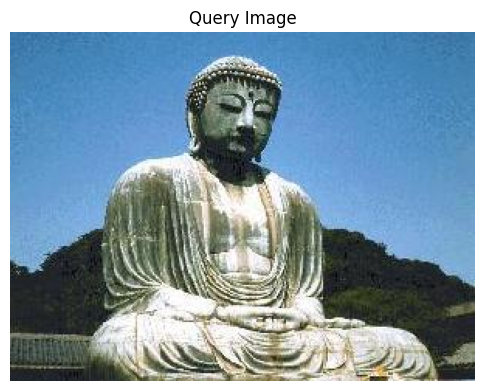

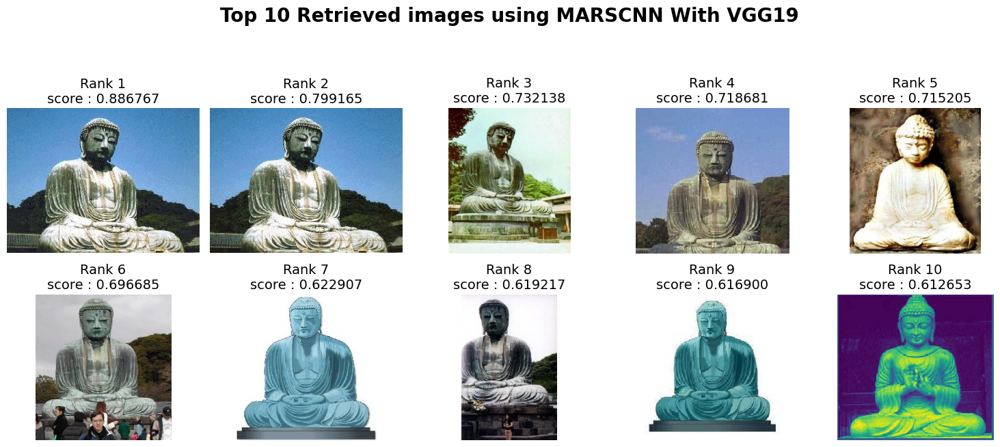

In [ ]:
import torch
import torchvision.models as models
from torch.utils.data import DataLoader
from tqdm import tqdm  # Import tqdm for progress bar

#load the model
vgg19_model_path = ParentDir + 'marscnn_vgg19_state_dict.pth'
vgg19_model = MARSCNN_VGG19(num_classes=15).to(device)
vgg19_model.load_state_dict(torch.load(vgg19_model_path,map_location=torch.device('cpu') ))

vgg19 = models.vgg19(pretrained=True)

# Remove the classification layer
vgg19.classifier = torch.nn.Sequential(*list(vgg19.classifier.children())[:-1])

vgg19 = vgg19.to(device)

vgg19.eval()

db_features = torch.load(ParentDir + 'vgg19_db_features.pth')

# Assuming preprocessed_images is a Dataset object
data_loader = DataLoader(preprocessed_images, batch_size=32, shuffle=False)

image_retrieval = ImageRetrieval(model=vgg19, device=device, db_features=db_features )

query_image_path = '/content/drive/MyDrive/Mahalle/dataset/caltech 101/buddha/image_0013.jpg'

top_images, top_ranks = image_retrieval.retrieve_top_n_similar_images(query_image_path, data_loader, top_n=10)

# Display the query image
image_retrieval.show_query_image(query_image_path)

print()
# Show images in a tile
image_retrieval.show_images_in_tile(top_images, tile_size=(5, 5), titles=top_ranks, subtitle='MARSCNN With VGG19')

# Multitask Multi-Attention Residual Shrinkage Convolutional Neural Network with ResNet50

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchsummary import summary
from tqdm import tqdm

# Define the Multitask Multi-Attention Residual Shrinkage Convolutional Neural Network with ResNet50
class MARSCNN_ResNet50(nn.Module):
    def __init__(self, num_classes=15):
        super(MARSCNN_ResNet50, self).__init__()

        # Load the pre-trained ResNet50 model
        resnet50 = models.resnet50(pretrained=True)

        # Remove the fully connected layers to get the feature extractor part
        self.feature_extractor = nn.Sequential(*list(resnet50.children())[:-2])

        # Unfreeze last few layers of ResNet50 for fine-tuning
        for param in self.feature_extractor.parameters():
            param.requires_grad = False
        for param in self.feature_extractor[-3:].parameters():
            param.requires_grad = True

        # Define the additional layers for MARSCNN
        self.conv1 = nn.Conv2d(2048, 1024, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(1024)  # Add batch normalization
        self.attention = nn.Sequential(
            nn.Conv2d(1024, 512, kernel_size=1),
            nn.ReLU(),
            nn.Conv2d(512, 1024, kernel_size=1),
            nn.Sigmoid()
        )
        self.residual_shrinkage = nn.Sequential(
            nn.Conv2d(1024, 1024, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(1024, 1024, kernel_size=3, stride=1, padding=1)
        )
        self.dropout = nn.Dropout(0.5)  # Add dropout layer

        # Final fully connected layer matching the number of classes
        self.fc = nn.Linear(1024 * 7 * 7, num_classes)  # Adjust based on ResNet50 output size

    def forward(self, x):
        # Forward pass through ResNet50 feature extractor
        x = self.feature_extractor(x)

        # Forward through MARSCNN layers
        x = self.conv1(x)
        x = self.bn1(x)  # Batch normalization
        attention_weights = self.attention(x)
        x = x * attention_weights
        x = self.residual_shrinkage(x) + x  # Residual connection

        # Flatten and pass through the fully connected layer
        x = torch.flatten(x, 1)
        x = self.dropout(x)  # Apply dropout
        x = self.fc(x)

        return x

# Instantiate the model
num_classes = 15
model_3 = MARSCNN_ResNet50(num_classes=num_classes).to(device)

print("Model: MARSCNN_ResNet50")
summary(model_3, (3, 224, 224))


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 116MB/s]


Model: MARSCNN_ResNet50
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm

In [ ]:
import torch
import torch.nn as nn
from torch.cuda.amp import GradScaler, autocast
from tqdm import tqdm

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_3.parameters(), lr=0.001)  # Use model_3 parameters

# Lists to store loss and accuracy history
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

# Ensure the model is in training mode
model_3.train()

# Initialize a GradScaler for mixed precision
scaler = GradScaler()

# Example Training Loop with Mixed Precision for 5 epochs
for epoch in range(5):
    model_3.train()
    running_loss = 0.0
    correct = 0
    total = 0

    # Training loop
    for images, labels in tqdm(train_loader):
        images, labels = images.to(device), labels.to(device)

        # Forward pass with mixed precision
        optimizer.zero_grad()
        with autocast():
            outputs = model_3(images)  # Use model_3 for forward pass
            loss = criterion(outputs, labels)

        # Backward pass with gradient scaling
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    avg_loss = running_loss / len(train_loader)
    accuracy = 100 * correct / total

    train_losses.append(avg_loss)
    train_accuracies.append(accuracy)

    print(f"Epoch [{epoch + 1}/5], Training Loss: {avg_loss:.4f}, Training Accuracy: {accuracy:.2f}%")

    # Validation loop
    model_3.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for val_images, val_labels in tqdm(val_loader):
            val_images, val_labels = val_images.to(device), val_labels.to(device)

            # Forward pass with mixed precision
            with autocast():
                val_outputs = model_3(val_images)  # Use model_3 for validation forward pass
                val_loss = criterion(val_outputs, val_labels)

            val_running_loss += val_loss.item()
            _, val_predicted = torch.max(val_outputs.data, 1)
            val_total += val_labels.size(0)
            val_correct += (val_predicted == val_labels).sum().item()

    val_avg_loss = val_running_loss / len(val_loader)
    val_accuracy = 100 * val_correct / val_total

    val_losses.append(val_avg_loss)
    val_accuracies.append(val_accuracy)

    print(f"Epoch [{epoch + 1}/5], Validation Loss: {val_avg_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")


100%|██████████| 64/64 [00:30<00:00,  2.07it/s]


Epoch [1/5], Training Loss: 4.7226, Training Accuracy: 46.24%


100%|██████████| 10/10 [00:03<00:00,  2.51it/s]


Epoch [1/5], Validation Loss: 0.9339, Validation Accuracy: 66.10%


100%|██████████| 64/64 [00:30<00:00,  2.08it/s]


Epoch [2/5], Training Loss: 0.9175, Training Accuracy: 71.70%


100%|██████████| 10/10 [00:03<00:00,  2.90it/s]


Epoch [2/5], Validation Loss: 0.8044, Validation Accuracy: 76.71%


100%|██████████| 64/64 [00:31<00:00,  2.06it/s]


Epoch [3/5], Training Loss: 0.5171, Training Accuracy: 84.51%


100%|██████████| 10/10 [00:03<00:00,  2.57it/s]


Epoch [3/5], Validation Loss: 0.3762, Validation Accuracy: 86.64%


100%|██████████| 64/64 [00:30<00:00,  2.08it/s]


Epoch [4/5], Training Loss: 0.2885, Training Accuracy: 90.62%


100%|██████████| 10/10 [00:03<00:00,  2.90it/s]


Epoch [4/5], Validation Loss: 0.2390, Validation Accuracy: 92.81%


100%|██████████| 64/64 [00:32<00:00,  1.96it/s]


Epoch [5/5], Training Loss: 0.1741, Training Accuracy: 93.84%


100%|██████████| 10/10 [00:03<00:00,  2.88it/s]

Epoch [5/5], Validation Loss: 0.1963, Validation Accuracy: 92.81%


In [ ]:
# Create a DataFrame
marscnn_resnet50_model_his = pd.DataFrame({
    'Train Loss': train_losses,
    'Train Accuracy': train_accuracies,
    'Validation Loss': val_losses,
    'Validation Accuracy': val_accuracies
})

# Optionally, save the DataFrame to a CSV file
marscnn_resnet50_model_his.to_csv(ParentDir + 'marscnn_resnet50_history.csv', index=False)

marscnn_resnet50_model_his

,Train Loss,Train Accuracy,Validation Loss,Validation Accuracy
0,4.722643,46.236559,0.933943,66.095890
1,0.917549,71.700880,0.804378,76.712329
2,0.517075,84.506354,0.376247,86.643836
3,0.288503,90.615836,0.238993,92.808219
4,0.174139,93.841642,0.196283,92.808219


# Model history

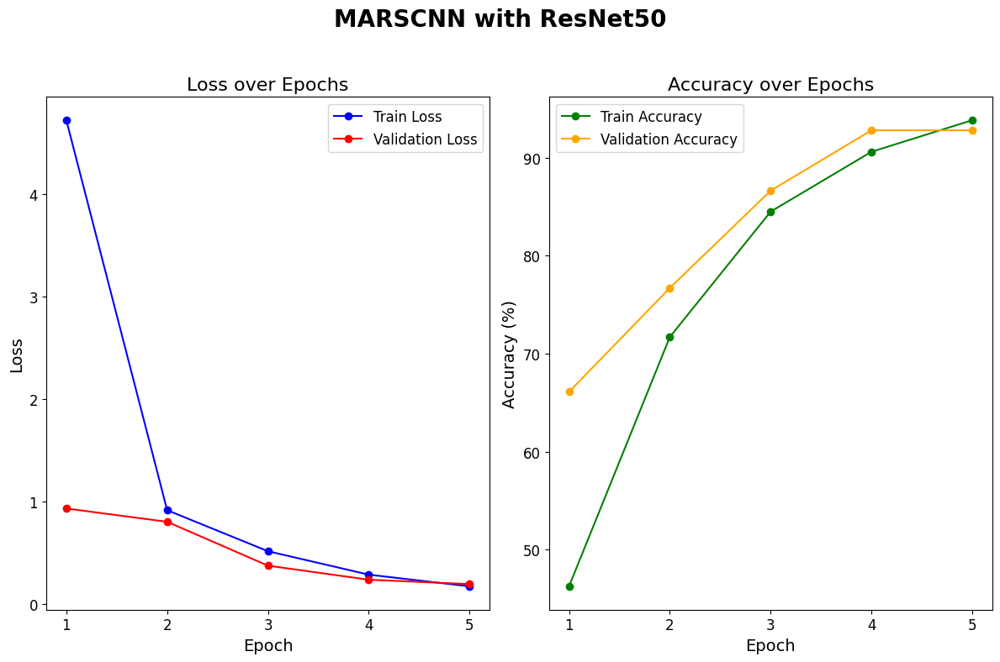

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

marscnn_resnet50_model_his = pd.read_csv(ParentDir + 'marscnn_resnet50_history.csv')

# Plotting the loss and accuracy history from the DataFrame
plt.figure(figsize=(12, 8))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(marscnn_resnet50_model_his.index + 1, marscnn_resnet50_model_his['Train Loss'], marker='o', linestyle='-', color='b', label='Train Loss')
plt.plot(marscnn_resnet50_model_his.index + 1, marscnn_resnet50_model_his['Validation Loss'], marker='o', linestyle='-', color='r', label='Validation Loss')
plt.title('Loss over Epochs', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.xticks(np.arange(1, len(marscnn_resnet50_model_his) + 1), fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(marscnn_resnet50_model_his.index + 1, marscnn_resnet50_model_his['Train Accuracy'], marker='o', linestyle='-', color='g', label='Train Accuracy')
plt.plot(marscnn_resnet50_model_his.index + 1, marscnn_resnet50_model_his['Validation Accuracy'], marker='o', linestyle='-', color='orange', label='Validation Accuracy')
plt.title('Accuracy over Epochs', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Accuracy (%)', fontsize=14)
plt.xticks(np.arange(1, len(marscnn_resnet50_model_his) + 1), fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

plt.suptitle('MARSCNN with ResNet50', fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])

plt.show()


# Save model

In [ ]:
# Save the model's state dictionary
torch.save(model_3.state_dict(), ParentDir + 'marscnn_resnet50_state_dict.pth')

# Load model

In [ ]:
resnet_model_path = ParentDir +'marscnn_resnet50_state_dict.pth'
resnet_model = MARSCNN_ResNet50(num_classes=15).to(device)
resnet_model.load_state_dict(torch.load(resnet_model_path,map_location=torch.device('cpu') ))
resnet_model.eval()

MARSCNN_ResNet50(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
       

# Results

# Model evaluation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

resnet_model.eval()  # Set the model to evaluation mode
all_labels = []
all_preds = []

with torch.no_grad():  # Disable gradient calculation for inference
    for images, labels in tqdm(test_loader):
        images, labels = images.to(device), labels.to(device)
        outputs = resnet_model(images)
        _, predicted = torch.max(outputs.data, 1)

        # Collect all labels and predictions
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(predicted.cpu().numpy())

# Convert lists to numpy arrays
all_labels = np.array(all_labels)
all_preds = np.array(all_preds)


100%|██████████| 19/19 [00:08<00:00,  2.12it/s]


<Figure size 1200x1000 with 0 Axes>

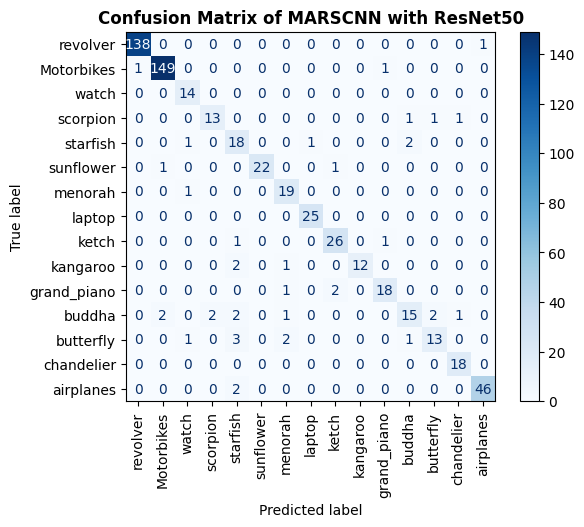

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)
classes = os.listdir(DataDir)

plt.figure(figsize=(12, 10))
# Plotting the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix of MARSCNN with ResNet50',fontweight = 'bold')
plt.xticks(np.arange(0,15),classes,rotation=90)
plt.yticks(np.arange(0,15),classes,rotation=0)
plt.show()

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Compute macro-averaged metrics
accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='micro')
recall = recall_score(all_labels, all_preds, average='micro')
f1 = f1_score(all_labels, all_preds, average='micro')

# Print the macro-averaged metrics
print(f"Accuracy: {accuracy:.6f}")
print(f"Precision: {precision:.6f}")
print(f"Recall: {recall:.6f}")
print(f"F1 Score: {f1:.6f}")
print(f"Error rate: {1-accuracy:.6f}")


Accuracy: 0.931741
Precision: 0.931741
Recall: 0.931741
F1 Score: 0.931741
Error rate: 0.068259


In [ ]:
results = {
    'Accuracy': [accuracy],
    'Precision': [precision],
    'Recall': [recall],
    'F1 Score': [f1],
    'Error Rate': [1-accuracy],
    'Model': ["MARSCNN_ResNet50"]
}

df = pd.DataFrame(results)
df.to_csv(ParentDir + 'model_comparison_results.csv', mode='a', header=False, index=False)

# Dataset feature vector extraction using ResNet50

In [ ]:
import torch
import torchvision.models as models
from torch.utils.data import DataLoader
from tqdm import tqdm  # Import tqdm for progress bar

# Load the pre-trained ResNet50 model
resnet50 = models.resnet50(pretrained=True)

resnet50 = torch.nn.Sequential(*list(resnet50.children())[:-2])

resnet50 = resnet50.to(device)

resnet50.eval()

def extract_features(data_loader, model):
    features_list = []

    with torch.no_grad():
        # Wrap the DataLoader with tqdm to show progress
        for images, _ in tqdm(data_loader, desc="Extracting Features"):
            # Move images to the same device as the model
            images = images.to(device)

            # Extract features
            features = model(images)
            features_list.append(features.cpu())  # Move features to CPU for concatenation

    # Concatenate all features into a single tensor
    all_features = torch.cat(features_list, dim=0)
    return all_features


resnet50_db_features = extract_features(data_loader,resnet50)

def flatten_resnet50_features(resnet50_features):
    # Flatten the features using AdaptiveAvgPool2d
    pool = nn.AdaptiveAvgPool2d((1, 1))
    flattened_features = pool(resnet50_features).view(resnet50_features.size(0), -1)
    return flattened_features

# Flattening ResNet50 features
resnet50_db_features = flatten_resnet50_features(resnet50_db_features)

saving_path = ParentDir + 'resnet50_db_features.pth'
# Save the features to a file
torch.save(resnet50_db_features,saving_path)
print(f"\ndataset Feature vector saved to {saving_path}")

Extracting Features: 100%|██████████| 92/92 [00:40<00:00,  2.25it/s]



dataset Feature vector saved to /content/drive/MyDrive/Mahalle/resnet50_db_features.pth


# Query 3

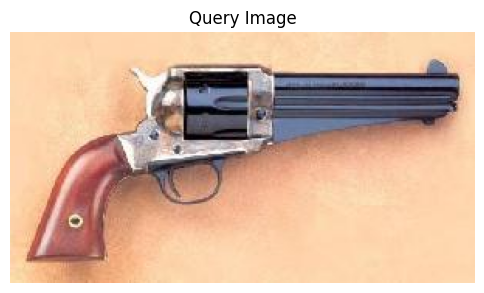

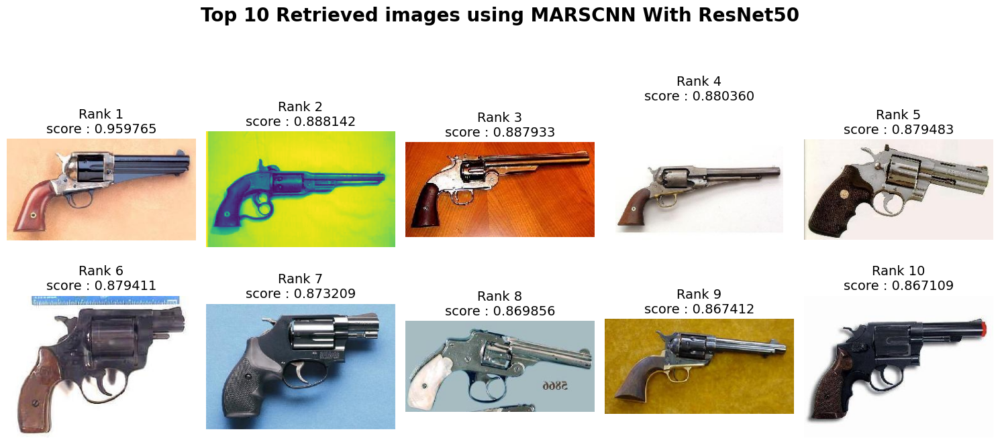

In [ ]:
import torch
import torchvision.models as models
from torch.utils.data import DataLoader
from tqdm import tqdm  # Import tqdm for progress bar

# Load the pre-trained ResNet50 model
resnet_model_path = ParentDir + 'marscnn_resnet50_state_dict.pth'
resnet50_model = MARSCNN_ResNet50(num_classes=15).to(device)
resnet50_model.load_state_dict(torch.load(resnet_model_path,map_location=torch.device('cpu') ))

resnet50 = models.resnet50(pretrained=True)

resnet50 = torch.nn.Sequential(*list(resnet50.children())[:-2])

resnet50 = resnet50.to(device)

resnet50.eval()

db_features = torch.load(ParentDir + 'resnet50_db_features.pth')

# Assuming preprocessed_images is a Dataset object
data_loader = DataLoader(preprocessed_images, batch_size=32, shuffle=False)

image_retrieval = ImageRetrieval(model=resnet50, device=device, db_features=db_features)

query_image_path =  '/content/drive/MyDrive/Mahalle/dataset/caltech 101/revolver/image_0002.jpg'

top_images, top_ranks = image_retrieval.retrieve_top_n_similar_images(query_image_path, data_loader, top_n=10)

# Display the query image
image_retrieval.show_query_image(query_image_path)

print()
# Show images in a tile
image_retrieval.show_images_in_tile(top_images, tile_size=(5, 5), titles=top_ranks, subtitle='MARSCNN With ResNet50')

# Multitask Multi-Attention Residual Shrinkage Convolutional Neural Network with Combined Model (AlexNet, VGG19, ResNet50)

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
from torchsummary import summary

# Define the Combined Multitask Multi-Attention Residual Shrinkage Convolutional Neural Network
class Combined_MARSCNN(nn.Module):
    def __init__(self, num_classes=15):
        super(Combined_MARSCNN, self).__init__()

        # Load the pre-trained AlexNet, VGG19, and ResNet50 models
        alexnet = models.alexnet(pretrained=True)
        vgg19 = models.vgg19(pretrained=True)
        resnet50 = models.resnet50(pretrained=True)

        # Feature extractors
        self.alexnet_feature_extractor = nn.Sequential(*list(alexnet.features.children()))
        self.vgg19_feature_extractor = nn.Sequential(*list(vgg19.features.children()))
        self.resnet50_feature_extractor = nn.Sequential(*list(resnet50.children())[:-2])

        # Freeze layers for AlexNet, VGG19, and ResNet50 (optional)
        for param in self.alexnet_feature_extractor.parameters():
            param.requires_grad = False
        for param in self.vgg19_feature_extractor.parameters():
            param.requires_grad = False
        for param in self.resnet50_feature_extractor.parameters():
            param.requires_grad = False

        # Global Average Pooling to make feature maps the same size
        self.global_avg_pool = nn.AdaptiveAvgPool2d((7, 7))

        # Define additional layers for MARSCNN
        self.conv1 = nn.Conv2d(2048 + 512 + 256, 1024, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(1024)
        self.attention = nn.Sequential(
            nn.Conv2d(1024, 512, kernel_size=1),
            nn.ReLU(),
            nn.Conv2d(512, 1024, kernel_size=1),
            nn.Sigmoid()
        )
        self.residual_shrinkage = nn.Sequential(
            nn.Conv2d(1024, 1024, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(1024, 1024, kernel_size=3, stride=1, padding=1)
        )
        self.dropout = nn.Dropout(0.5)

        # Final fully connected layer matching the number of classes
        self.fc = nn.Linear(1024 * 7 * 7, num_classes)

    def forward(self, x):
        # Forward pass through each feature extractor
        alexnet_features = self.alexnet_feature_extractor(x)
        vgg19_features = self.vgg19_feature_extractor(x)
        resnet50_features = self.resnet50_feature_extractor(x)

        # Apply global average pooling to ensure feature maps are of the same size (7x7)
        alexnet_features = self.global_avg_pool(alexnet_features)
        vgg19_features = self.global_avg_pool(vgg19_features)
        resnet50_features = self.global_avg_pool(resnet50_features)

        # Concatenate the feature maps
        combined_features = torch.cat([alexnet_features, vgg19_features, resnet50_features], dim=1)

        # Forward through MARSCNN layers
        x = self.conv1(combined_features)
        x = self.bn1(x)
        attention_weights = self.attention(x)
        x = x * attention_weights
        x = self.residual_shrinkage(x) + x  # Residual connection

        # Flatten and pass through the fully connected layer
        x = torch.flatten(x, 1)
        x = self.dropout(x)
        x = self.fc(x)

        return x

# Instantiate the model
num_classes = 15
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_4 = Combined_MARSCNN(num_classes=num_classes).to(device)

# Print model summary
print("Model: Combined MARSCNN (AlexNet, VGG19, ResNet50)")
summary(model_4, (3, 224, 224))


Model: Combined MARSCNN (AlexNet, VGG19, ResNet50)
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]     

In [ ]:
# Import the necessary module for mixed precision
from torch.cuda.amp import GradScaler, autocast
from torch import nn
import torch
from tqdm import tqdm

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_4.parameters(), lr=0.001)  # Use model_4 parameters for the combined model

# Lists to store loss and accuracy history
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

# Ensure the model is in training mode
model_4.train()

# Initialize a GradScaler for mixed precision
scaler = GradScaler()

# Example Training Loop with Mixed Precision for 5 epochs
for epoch in range(5):
    model_4.train()
    running_loss = 0.0
    correct = 0
    total = 0

    # Training loop
    for images, labels in tqdm(train_loader):
        images, labels = images.to(device), labels.to(device)

        # Forward pass with mixed precision
        optimizer.zero_grad()
        with autocast():
            outputs = model_4(images)  # Use model_4 for forward pass
            loss = criterion(outputs, labels)

        # Backward pass with gradient scaling
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    avg_loss = running_loss / len(train_loader)
    accuracy = 100 * correct / total

    train_losses.append(avg_loss)
    train_accuracies.append(accuracy)

    print(f"Epoch [{epoch + 1}/5], Training Loss: {avg_loss:.4f}, Training Accuracy: {accuracy:.2f}%")

    # Validation loop
    model_4.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for val_images, val_labels in tqdm(val_loader):
            val_images, val_labels = val_images.to(device), val_labels.to(device)

            # Forward pass with mixed precision
            with autocast():
                val_outputs = model_4(val_images)  # Use model_4 for validation forward pass
                val_loss = criterion(val_outputs, val_labels)

            val_running_loss += val_loss.item()
            _, val_predicted = torch.max(val_outputs.data, 1)
            val_total += val_labels.size(0)
            val_correct += (val_predicted == val_labels).sum().item()

    val_avg_loss = val_running_loss / len(val_loader)
    val_accuracy = 100 * val_correct / val_total

    val_losses.append(val_avg_loss)
    val_accuracies.append(val_accuracy)

    print(f"Epoch [{epoch + 1}/5], Validation Loss: {val_avg_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")


100%|██████████| 64/64 [00:34<00:00,  1.87it/s]


Epoch [1/5], Training Loss: 2.7785, Training Accuracy: 81.43%


100%|██████████| 10/10 [00:04<00:00,  2.35it/s]


Epoch [1/5], Validation Loss: 0.0555, Validation Accuracy: 97.60%


100%|██████████| 64/64 [00:33<00:00,  1.90it/s]


Epoch [2/5], Training Loss: 0.0856, Training Accuracy: 97.17%


100%|██████████| 10/10 [00:04<00:00,  2.36it/s]


Epoch [2/5], Validation Loss: 0.0843, Validation Accuracy: 98.97%


100%|██████████| 64/64 [00:33<00:00,  1.94it/s]


Epoch [3/5], Training Loss: 0.1027, Training Accuracy: 97.65%


100%|██████████| 10/10 [00:04<00:00,  2.05it/s]


Epoch [3/5], Validation Loss: 0.0557, Validation Accuracy: 97.95%


100%|██████████| 64/64 [00:32<00:00,  1.95it/s]


Epoch [4/5], Training Loss: 0.0894, Training Accuracy: 98.39%


100%|██████████| 10/10 [00:04<00:00,  2.27it/s]


Epoch [4/5], Validation Loss: 0.2353, Validation Accuracy: 96.58%


100%|██████████| 64/64 [00:34<00:00,  1.86it/s]


Epoch [5/5], Training Loss: 0.0666, Training Accuracy: 98.88%


100%|██████████| 10/10 [00:04<00:00,  2.33it/s]

Epoch [5/5], Validation Loss: 0.0706, Validation Accuracy: 98.97%


In [ ]:
# Create a DataFrame
marscnn_combined_model_his = pd.DataFrame({
    'Train Loss': train_losses,
    'Train Accuracy': train_accuracies,
    'Validation Loss': val_losses,
    'Validation Accuracy': val_accuracies
})

# Optionally, save the DataFrame to a CSV file
marscnn_combined_model_his.to_csv(ParentDir + 'marscnn_combined_history.csv', index=False)

# Print the DataFrame to verify
marscnn_combined_model_his

,Train Loss,Train Accuracy,Validation Loss,Validation Accuracy
0,2.778544,81.427175,0.055482,97.602740
1,0.085569,97.165200,0.084285,98.972603
2,0.102737,97.653959,0.055681,97.945205
3,0.089417,98.387097,0.235320,96.575342
4,0.066571,98.875855,0.070562,98.972603


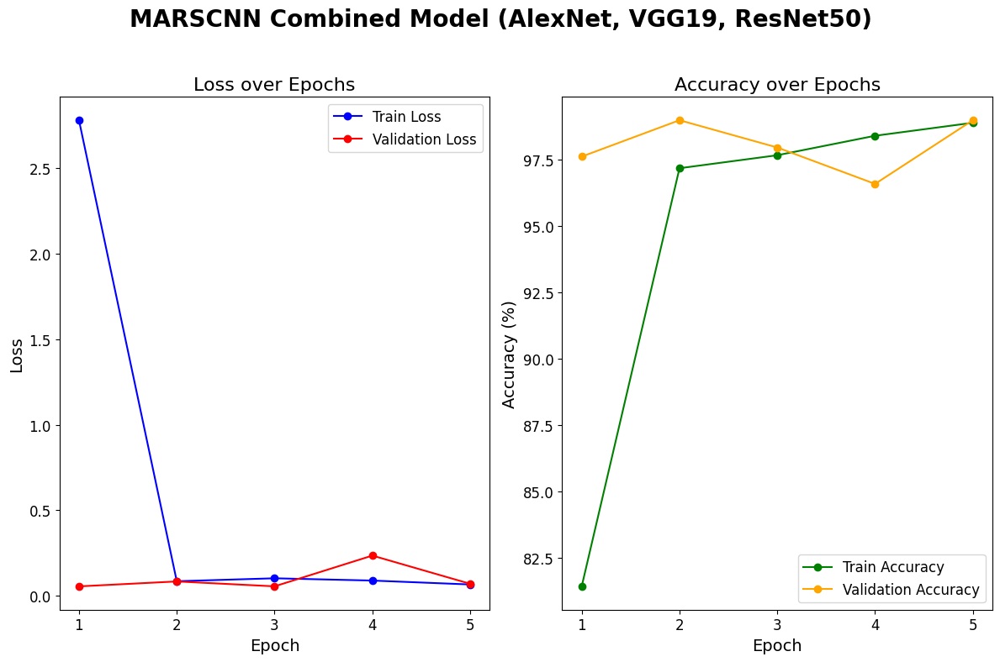

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

marscnn_combined_model_his = pd.read_csv(ParentDir + 'marscnn_combined_history.csv')

# Plotting the loss and accuracy history from the DataFrame
plt.figure(figsize=(12, 8))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(marscnn_combined_model_his.index + 1, marscnn_combined_model_his['Train Loss'], marker='o', linestyle='-', color='b', label='Train Loss')
plt.plot(marscnn_combined_model_his.index + 1, marscnn_combined_model_his['Validation Loss'], marker='o', linestyle='-', color='r', label='Validation Loss')
plt.title('Loss over Epochs', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.xticks(np.arange(1, len(marscnn_combined_model_his) + 1), fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(marscnn_combined_model_his.index + 1, marscnn_combined_model_his['Train Accuracy'], marker='o', linestyle='-', color='g', label='Train Accuracy')
plt.plot(marscnn_combined_model_his.index + 1, marscnn_combined_model_his['Validation Accuracy'], marker='o', linestyle='-', color='orange', label='Validation Accuracy')
plt.title('Accuracy over Epochs', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Accuracy (%)', fontsize=14)
plt.xticks(np.arange(1, len(marscnn_combined_model_his) + 1), fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

plt.suptitle('MARSCNN Combined Model (AlexNet, VGG19, ResNet50)', fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])

plt.show()


# Save model

In [ ]:
# Save the model's state dictionary
torch.save(model_4.state_dict(), ParentDir + 'marscnn_combined_state_dict.pth')

# Load model

In [ ]:
combined_model_path = ParentDir + 'marscnn_combined_state_dict.pth'
combined_model = Combined_MARSCNN(num_classes=15).to(device)
combined_model.load_state_dict(torch.load(combined_model_path,map_location=torch.device('cpu') ))
combined_model.eval()

Combined_MARSCNN(
  (alexnet_feature_extractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (vgg19_feature_extractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2

# Results

# Model evaluation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

combined_model.eval()  # Set the model to evaluation mode
all_labels = []
all_preds = []

with torch.no_grad():  # Disable gradient calculation for inference
    for images, labels in tqdm(test_loader):
        images, labels = images.to(device), labels.to(device)
        outputs = combined_model(images)
        _, predicted = torch.max(outputs.data, 1)

        # Collect all labels and predictions
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(predicted.cpu().numpy())

# Convert lists to numpy arrays
all_labels = np.array(all_labels)
all_preds = np.array(all_preds)


100%|██████████| 19/19 [00:12<00:00,  1.53it/s]


<Figure size 1500x1000 with 0 Axes>

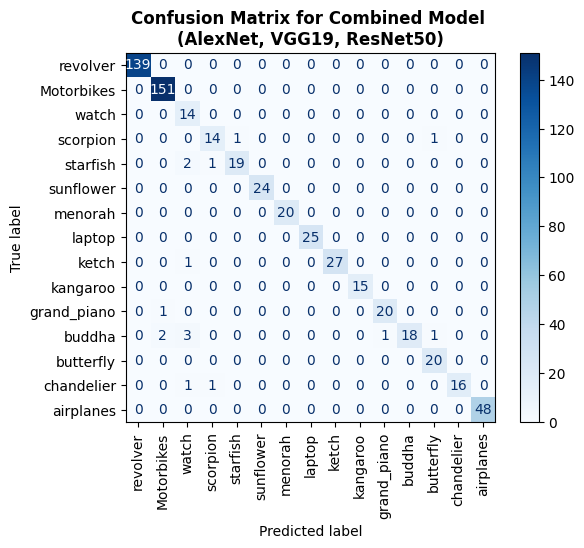

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)
classes = os.listdir(DataDir)

plt.figure(figsize=(15, 10))
# Plotting the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Combined Model \n(AlexNet, VGG19, ResNet50)',fontweight = 'bold')
plt.xticks(np.arange(0,15),classes,rotation=90)
plt.yticks(np.arange(0,15),classes,rotation=0)
plt.show()

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Compute macro-averaged metrics
accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='micro')
recall = recall_score(all_labels, all_preds, average='micro')
f1 = f1_score(all_labels, all_preds, average='micro')

# Print the macro-averaged metrics
print(f"Accuracy: {accuracy:.6f}")
print(f"Precision: {precision:.6f}")
print(f"Recall: {recall:.6f}")
print(f"F1 Score: {f1:.6f}")
print(f"Error rate: {1-accuracy:.6f}")


Accuracy: 0.972696
Precision: 0.972696
Recall: 0.972696
F1 Score: 0.972696
Error rate: 0.027304


In [ ]:
results = {
    'Accuracy': [accuracy],
    'Precision': [precision],
    'Recall': [recall],
    'F1 Score': [f1],
    'Error Rate': [1-accuracy],
    'Model': ["MARSCNN_combined"]
}

df = pd.DataFrame(results)
df.to_csv(ParentDir + 'model_comparison_results.csv', mode='a', header=False, index=False)

In [ ]:
# Read and display the CSV file to check the results
df_read = pd.read_csv(ParentDir + 'model_comparison_results.csv')
df_read


,Accuracy,Precision,Recall,F1 Score,Error Rate,Model
0,0.878840,0.878840,0.878840,0.878840,0.121160,MARSCNN_AlexNet
1,0.974403,0.966302,0.956075,0.959300,0.025597,MARSCNN_VGG19
2,0.931741,0.931741,0.931741,0.931741,0.068259,MARSCNN_ResNet50
3,0.972696,0.972696,0.972696,0.972696,0.027304,MARSCNN_combined


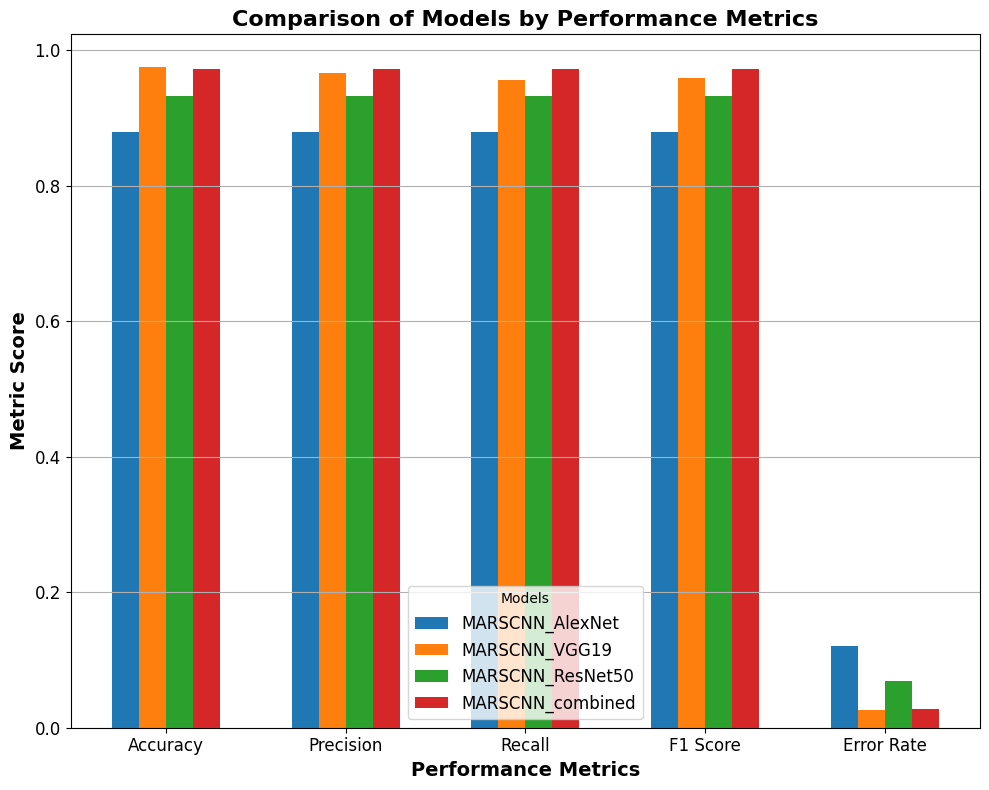

In [ ]:
# Correcting the shape mismatch by adjusting the DataFrame and plotting
bar_width = 0.15
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Error Rate']
index = np.arange(len(metrics))

# Plotting the bar graph with metrics as x-axis labels and models as legends
plt.figure(figsize=(10, 8))

# Adding bars for each model
for i, model in enumerate(df_read['Model']):
    plt.bar(index + i * bar_width, df_read.iloc[i, :-1], bar_width, label=model)

# Customizing the plot
plt.xlabel('Performance Metrics', fontsize=14, fontweight='bold')
plt.ylabel('Metric Score', fontsize=14, fontweight='bold')
plt.title('Comparison of Models by Performance Metrics', fontsize=16, fontweight='bold')
plt.xticks(index + bar_width * 1.5, metrics, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(loc = 8 , title='Models', fontsize=12)
plt.grid(axis='y')
plt.tight_layout()

# Display the plot
plt.show()


# Feature concatenation using Attention mechanism

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class FeatureAttention(nn.Module):
    def __init__(self, feature_dim):
        super(FeatureAttention, self).__init__()
        self.attention = nn.Sequential(
            nn.Linear(feature_dim, 512),
            nn.ReLU(inplace=True),
            nn.Linear(512, 1)
        )

    def forward(self, features):
        # Compute attention scores
        attn_scores = self.attention(features)
        attn_weights = F.softmax(attn_scores, dim=1)

        # Apply attention weights to features
        weighted_features = features * attn_weights
        return weighted_features

# Apply attention to each feature set
attention1 = FeatureAttention(4096).to(device)
attention2 = FeatureAttention(2048).to(device)


alex_net_db = torch.load(ParentDir + 'alexnet_db_features.pth')
vgg19_db = torch.load(ParentDir + 'vgg19_db_features.pth')
resnet50_db = torch.load(ParentDir + 'resnet50_db_features.pth')

alexnet_features_att = attention1(alex_net_db.to(device))
vgg19_features_att = attention1(vgg19_db.to(device))
resnet50_features_att = attention2(resnet50_db.to(device))

# Concatenate the attention-weighted features
combined_db_features = torch.cat((alexnet_features_att, vgg19_features_att, resnet50_features_att), dim=1)

print(f'db feature vector shape :{combined_db_features.shape}')

db feature vector shape :torch.Size([2924, 10240])


# Content based Image Retrivel system from combined feature vector

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F

class imageRetrievalFromCombinedFeatures:
    def __init__(self, model, device, db_features,models = [alexnet, vgg19, resnet50], transform=None):
        self.models = [model.to(device) for model in models]
        self.device = device
        self.db_features = db_features
        self.transform = transform or transforms.Compose([
            transforms.Resize((224, 224)),                    # Resize image to 224x224 pixels
            transforms.RandomHorizontalFlip(),                # Randomly flip images horizontally
            transforms.RandomRotation(degrees=15),            # Randomly rotate images by up to 15 degrees
            transforms.ColorJitter(brightness=0.2,            # Randomly adjust brightness, contrast, saturation, and hue
                                   contrast=0.2,
                                   saturation=0.2, hue=0.1),
            transforms.ToTensor(),                            # Convert the image to a tensor
            transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize the tensor
                                 std=[0.229, 0.224, 0.225])
        ])

    def preprocess_query_image(self, image_path):
        # Load and preprocess the image using the defined transformations
        image = Image.open(image_path).convert('RGB')
        image = self.transform(image).unsqueeze(0)  # Add batch dimension
        return image.to(self.device)

    def extract_query_feature(self, image_tensor):
        features_list = []
        with torch.no_grad():
            for model in self.models:
                features = model(image_tensor)

                # Flatten the features if the model is a sequential model (like ResNet)
                if isinstance(model, nn.Sequential) or features.dim() == 4:
                    pool = nn.AdaptiveAvgPool2d((1, 1))
                    features = pool(features).view(features.size(0), -1)
                    features = attention2(features)
                else:
                    features = attention1(features)

                features_list.append(features)

        combined_features = torch.cat(features_list, dim=1)
        combined_features = torch.tensor(combined_features)

        return combined_features


    def compute_similarity(self, query_features):
        # Compute cosine similarity
        similarity = cosine_similarity(query_features.cpu(), self.db_features.cpu().detach().numpy())
        return similarity.flatten()

    def retrieve_top_n_similar_images(self, query_image_path, dataset_loader, top_n=5):
        # Preprocess the query image
        query_tensor = self.preprocess_query_image(query_image_path)

        # Extract features for the query image
        query_features = self.extract_query_feature(query_tensor)

        # Compute similarity scores
        similarity = self.compute_similarity(query_features)

        # Get the indices of the top N most similar images
        top_indices = np.argsort(-similarity)[:top_n]

        # Retrieve the corresponding image paths
        top_images = [dataset_loader.dataset.imgs[idx][0] for idx in top_indices]

        return top_images, similarity[top_indices]

    @staticmethod
    def show_images_in_tile(image_paths, tile_size=(5, 5), titles=None, subtitle=None):
        top_n = len(image_paths)
        plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
        for i, image_path in enumerate(image_paths):
            img = Image.open(image_path)
            plt.subplot(tile_size[0], tile_size[1], i + 1)
            plt.imshow(img)
            plt.axis('off')
            if titles is not None:
                plt.title(f"Rank {i+1}\nscore : {titles[i]:.6f}", fontsize=14)

        plt.suptitle(f'Top {top_n} Retrieved images using {subtitle}', fontsize=20, fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    @staticmethod
    def show_query_image(query_image_path):
        plt.figure(figsize=(6, 6))  # Adjust the figure size as needed
        img = Image.open(query_image_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title("Query Image")
        plt.show()


# Query 4

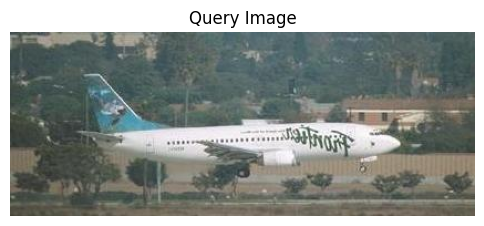

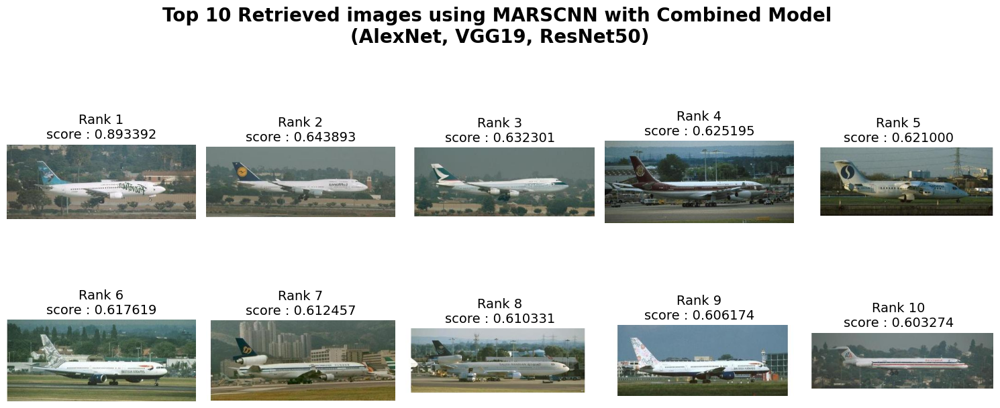

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models


combined_model_path = ParentDir + 'marscnn_combined_state_dict.pth'
combined_model = Combined_MARSCNN(num_classes=15).to(device)
combined_model.load_state_dict(torch.load(combined_model_path,map_location=torch.device('cpu') ))
combined_model.eval()

# Example usage
query_image_path =  "/content/drive/MyDrive/Mahalle/dataset/caltech 101/airplanes/image_0743.jpg"

db_features = combined_db_features

# Initialize the retrieval system
image_retrieval = imageRetrievalFromCombinedFeatures(model=combined_model, device=device, db_features=db_features)

# Retrieve top similar images
top_images, similarities = image_retrieval.retrieve_top_n_similar_images(query_image_path, data_loader, top_n=10)

# Display the query image
image_retrieval.show_query_image(query_image_path)

print()

# Display the retrieved images in a tile
image_retrieval.show_images_in_tile(top_images, titles=similarities, subtitle='MARSCNN with Combined Model \n(AlexNet, VGG19, ResNet50)')


# Query 5

Saving bike.jfif to bike (2).jfif


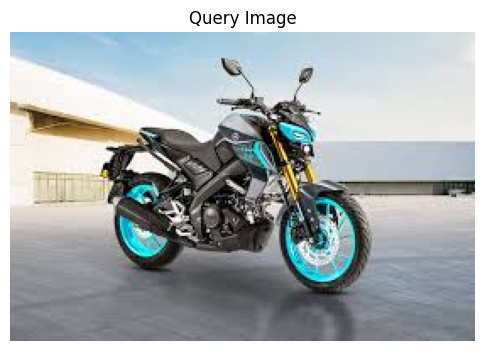

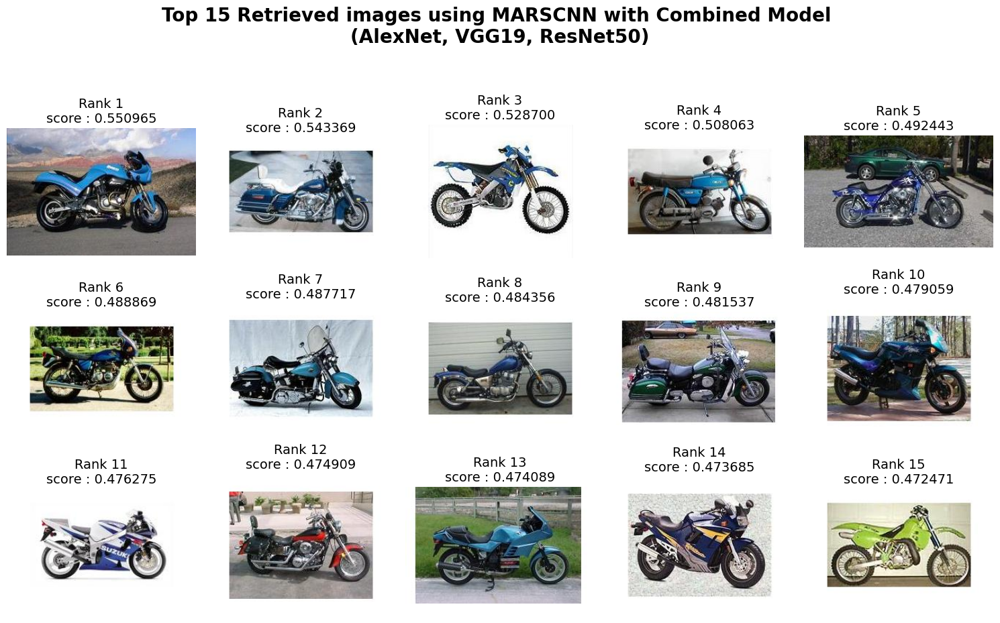

In [ ]:
uploaded = files.upload()

# Get the uploaded image path
query_image_path = list(uploaded.keys())[0]

db_features = combined_db_features

# Initialize the retrieval system
image_retrieval = imageRetrievalFromCombinedFeatures(model=combined_model, device=device, db_features=db_features)

# Retrieve top similar images
top_images, similarities = image_retrieval.retrieve_top_n_similar_images(query_image_path, data_loader, top_n=15)

# Display the query image
image_retrieval.show_query_image(query_image_path)

print()

# Display the retrieved images in a tile
image_retrieval.show_images_in_tile(top_images, titles=similarities, subtitle='MARSCNN with Combined Model \n(AlexNet, VGG19, ResNet50)')
